In [125]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import numpy
import pandas as pd
import ast
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from collections import Counter
import seaborn as sns
sns.set_theme()
%matplotlib inline

In [126]:
df = pd.read_csv("FinalData.csv")

question_nested_list = df['Questions'].values.tolist()
questions_list = [item for sublist in question_nested_list for item in ast.literal_eval(sublist)]


In [127]:
# len(questions_list)
# question_length = [ len(question_data.split()) for question_data in questions_list]
def replace_meaning_less_words_str(question):
    for redundant_word in ["vo", "will", "ok", "okay", ":"]:
        question = question.lower().replace(redundant_word, "")
    return question.strip()

df_org_questions = pd.DataFrame({"questions" : questions_list})
df_org_questions["questions"] = df_org_questions["questions"].apply(replace_meaning_less_words_str)
df_org_questions["word_question_length"] = df_org_questions["questions"].apply(lambda x : len(x.split()))
df_questions = df_org_questions[df_org_questions["word_question_length"] <= 35]
print(df_questions.shape)

(12110, 2)


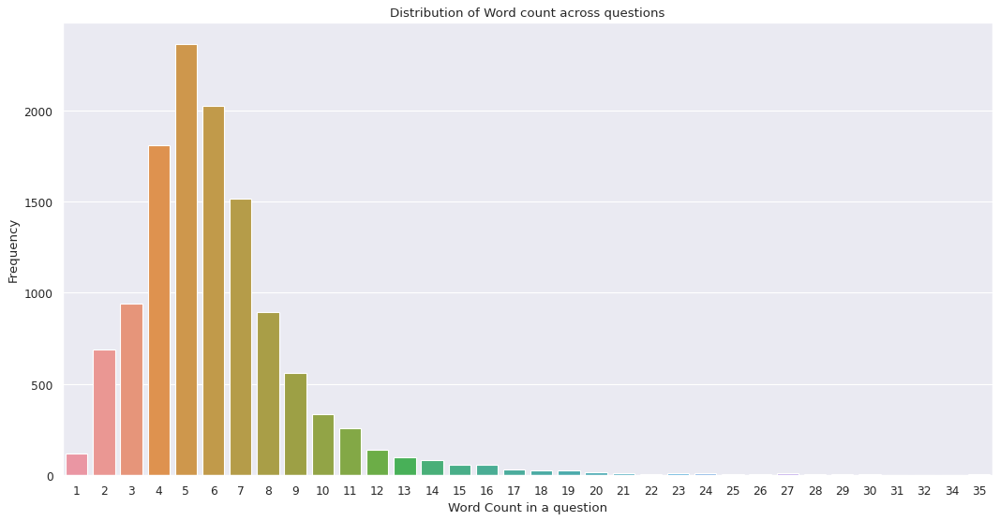

In [128]:
word_count_per_question = df_questions["word_question_length"].value_counts().to_dict()
df_word_count = pd.DataFrame({"Question_Word_count" : word_count_per_question.keys(), 
                            "Frequency" : word_count_per_question.values()})
# df_word_count['Question_Word_count'] = df_word_count['Question_Word_count'].astype(str)
figure(figsize=(16, 8), dpi=80)
ax = sns.barplot(x="Question_Word_count", y="Frequency", data=df_word_count).set(title='Distribution of Word count across questions', xlabel='Word Count in a question', ylabel='Frequency')

# df_questions["word_question_length"].plot.hist(bins=100)


In [62]:
# for index, question_word_count in enumerate(question_length):
#     if question_word_count > 30 and question_word_count < 50: 
#         print(questions_list[index])


In [63]:
# vectorizer = TfidfVectorizer(stop_words="english")
# X = vectorizer.fit_transform(questions_list)
# # used words (axis in our multi-dimensional space)
# words = vectorizer.get_feature_names()
# # print("words", words)
# print(len(words))


In [91]:
# for name, group in df_questions.groupby("word_question_length"):
#     if name == 3:
#         break
#     questions_group_org = group["questions"].values.tolist()
#     questions_group = [questions.replace(" ", "_") for questions in questions_group_org]
#     figure(figsize=(8, 8), dpi=80)
#     questions_text = " ".join(questions_group)
#     stopwords = set(STOPWORDS)
#     stopwords.update(["vo", "u", "will", "ur", "ok", "okay"])

#     # wordcloud = WordCloud().generate(questions_list[0])
#     wordcloud = WordCloud(stopwords=stopwords, max_font_size=50, max_words=100, background_color='white', colormap='Set2').generate(questions_text)

#     # Display the generated image:
#     plt.imshow(wordcloud, interpolation='bilinear')
#     plt.title("WordCloud for Questions with {word_count} word or words".format(word_count=name))
#     plt.axis("off")
#     plt.show()



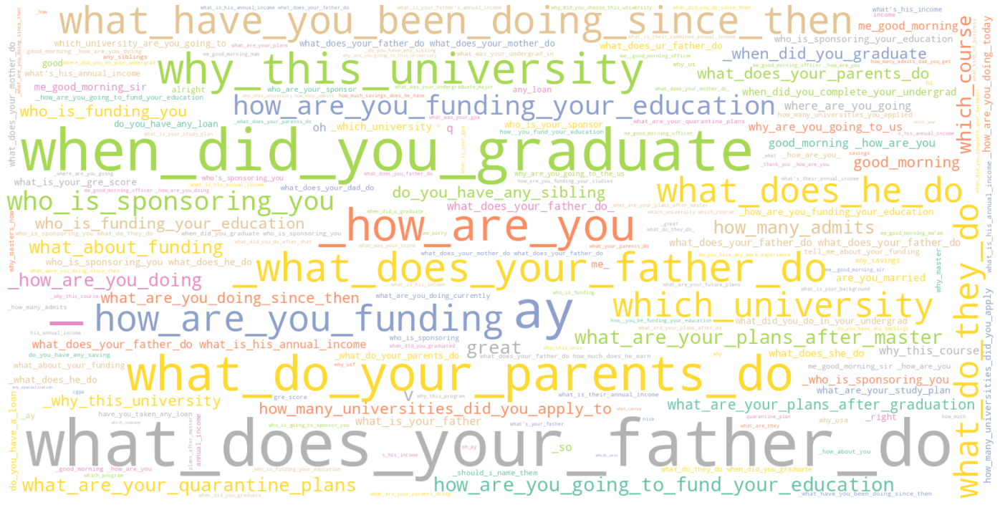

In [129]:
master_questions = []
for name, group in df_questions.groupby("word_question_length"):
    questions_group_org = group["questions"].values.tolist()
    questions_group = [questions.strip().replace(" ", "_") for questions in questions_group_org]
    master_questions.extend(questions_group)



figure(figsize=(19.20,10.80))
questions_text = " ".join(master_questions)
stopwords = set(STOPWORDS)
stopwords.update(["vo", "u", "will", "ur", "ok", "okay"])

# wordcloud = WordCloud().generate(questions_list[0])
# wordcloud = WordCloud(width=1600, height=800, stopwords=stopwords, max_font_size=50, max_words=100, background_color='white', colormap='Set2').generate(questions_text)

wordcloud = WordCloud(width=1600, height=800, stopwords=stopwords, background_color='white', colormap='Set2').generate(questions_text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
# plt.title("WordCloud for Questions Asked in Visa Interview's".format(word_count=name))
plt.axis("off")
plt.tight_layout(pad=0)
# plt.show()
plt.savefig("VisaInterView_Questions.png", format='png' , dpi=150)



## TODO
* Per each region get the word cloud
* Word cloud for rejected and accepted



In [135]:
def prepare_question_list(df_to_work):
    packed_question_list = df_to_work['Questions'].values.tolist()
    unpacked_questions_list = [item for sublist in packed_question_list for item in ast.literal_eval(sublist)]
    return unpacked_questions_list


def clean_the_questions(questions_list_to_clean):
    def replace_meaning_less_words_str(question):
        for redundant_word in ["vo", "will", "ok", "okay", ":"]:
            question = question.strip().lower().replace(redundant_word, "")
        return question.strip()

    df_questions_to_clean = pd.DataFrame({"questions" : questions_list_to_clean})
    df_questions_to_clean["questions"] = df_questions_to_clean["questions"].apply(replace_meaning_less_words_str)
    df_questions_to_clean["word_question_length"] = df_questions_to_clean["questions"].apply(lambda x : len(x.split()))
    df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
    print(df_final_questions.shape)
    return df_final_questions


def plot_bar_chart(df_final_questions):
    count_per_question = df_final_questions["word_question_length"].value_counts().to_dict()
    df_word_count = pd.DataFrame({"Question_Word_count" : count_per_question.keys(), 
                                "Frequency" : count_per_question.values()})
    # df_word_count['Question_Word_count'] = df_word_count['Question_Word_count'].astype(str)
    figure(figsize=(16, 8), dpi=80)
    ax = sns.barplot(x="Question_Word_count", y="Frequency", data=df_word_count).set(title='Distribution of Word count across questions', xlabel='Word Count in a question', ylabel='Frequency')


def plot_final_wordcloud_chart(df_final_questions, location=None, v_status=None):
    final_questions = []
    for name, group in df_final_questions.groupby("word_question_length"):
        questions_group_org = group["questions"].values.tolist()
        questions_group = [questions.replace(" ", "_") for questions in questions_group_org]
        final_questions.extend(questions_group)

    figure(figsize=(19.20,10.80))
    questions_text = " ".join(final_questions)
    stopwords = set(STOPWORDS)
    stopwords.update(["vo", "u", "will", "ur", "ok", "okay"])

    # wordcloud = WordCloud().generate(questions_list[0])
    # wordcloud = WordCloud(width=1600, height=800, stopwords=stopwords, max_font_size=50, max_words=100, background_color='white', colormap='Set2').generate(questions_text)

    wordcloud = WordCloud(width=1600, height=800, stopwords=stopwords, background_color='white', colormap='Set2').generate(questions_text)

    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    # plt.show()
    
    if location is not None:
        plt.title("WordCloud for Questions Asked at {consulate} Visa Interview questions".format(consulate=location))
        plt.savefig("{location}_VisaInterView_Questions.png".format(location=location), format='png' , dpi=150)

    if v_status is not None:
        plt.title("WordCloud for Questions that were asked for {consulate} candidates".format(consulate=v_status))
        plt.savefig("{consulate}_VisaInterView_Questions.png".format(consulate=v_status), format='png' , dpi=150)




/tmp/ipykernel_212/1084488425.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
(1978, 2)
/tmp/ipykernel_212/1084488425.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
(2531, 2)
/tmp/ipykernel_212/1084488425.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
(1990, 2)
/tmp/ipykernel_212/1084488425.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
(770, 2)
/tmp/ipykernel_212/1084488425.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = d

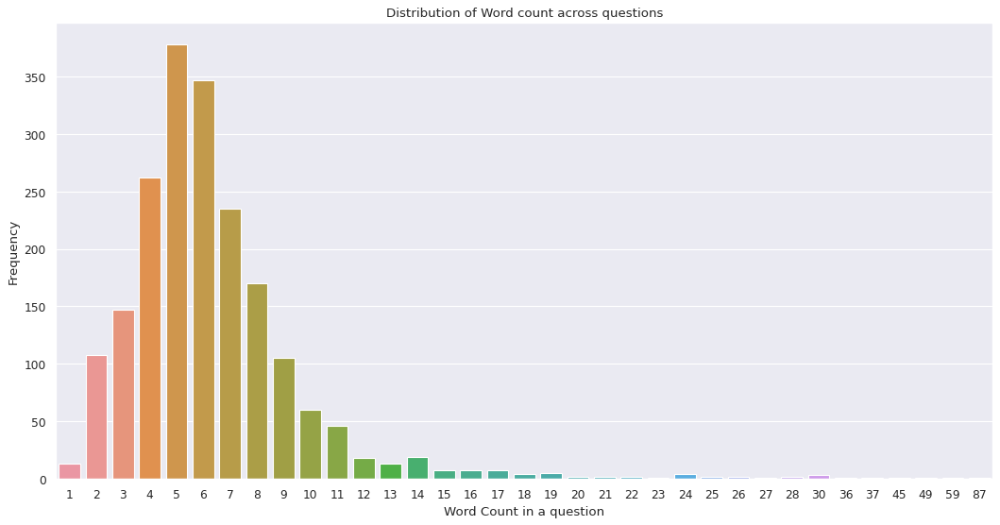

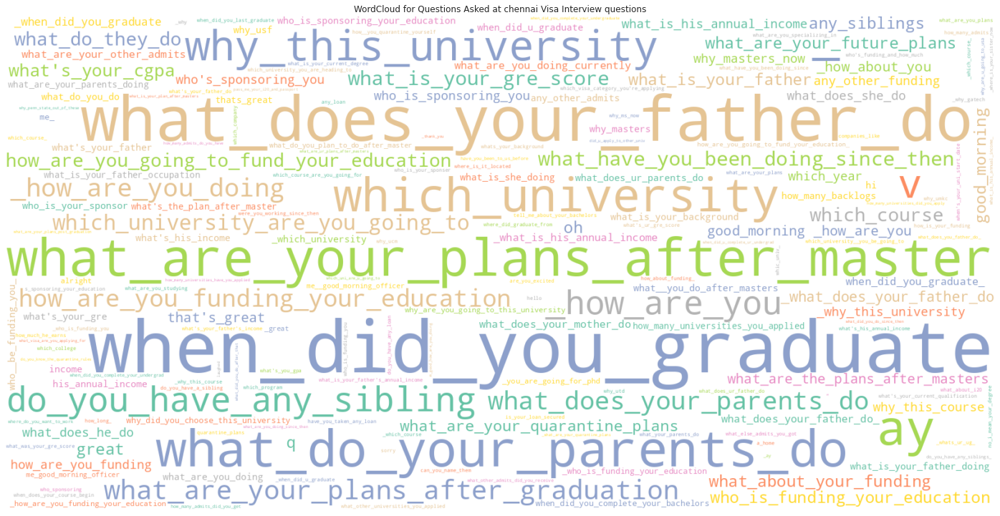

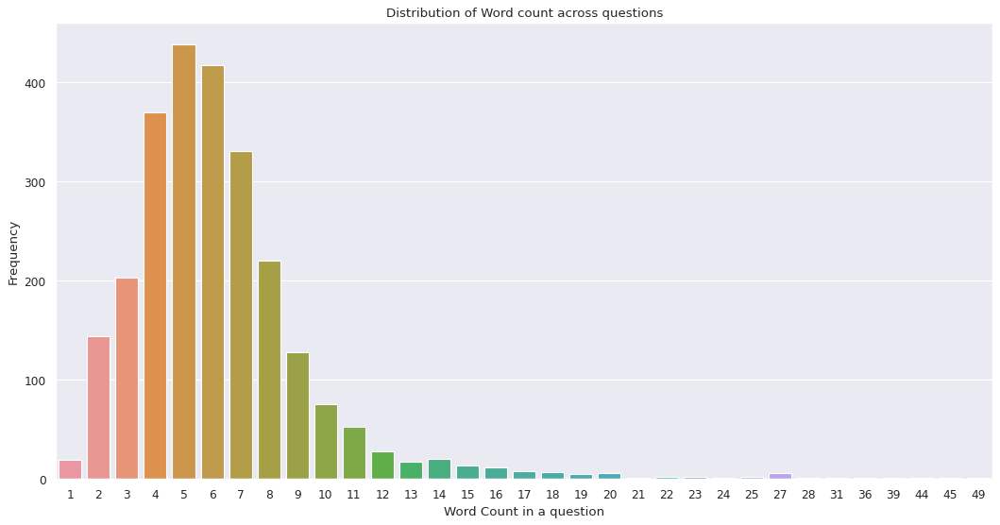

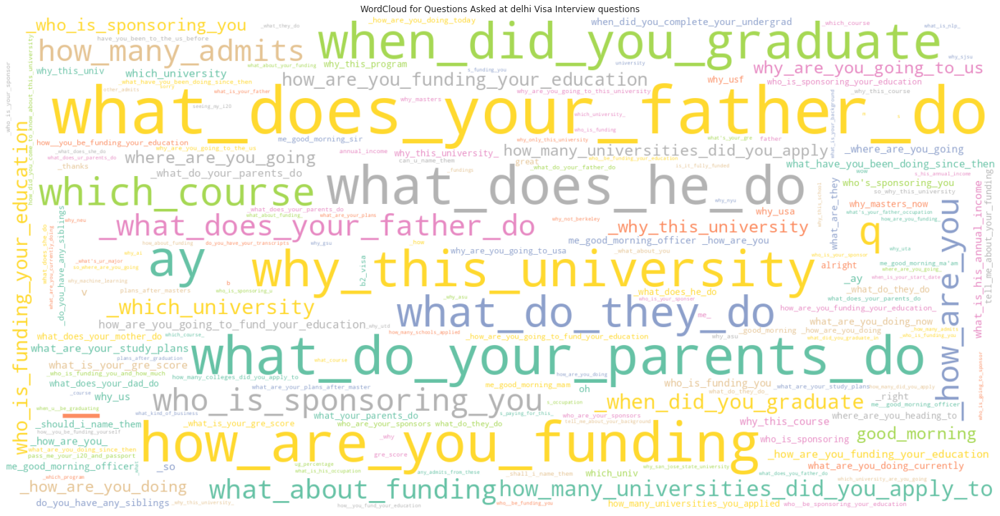

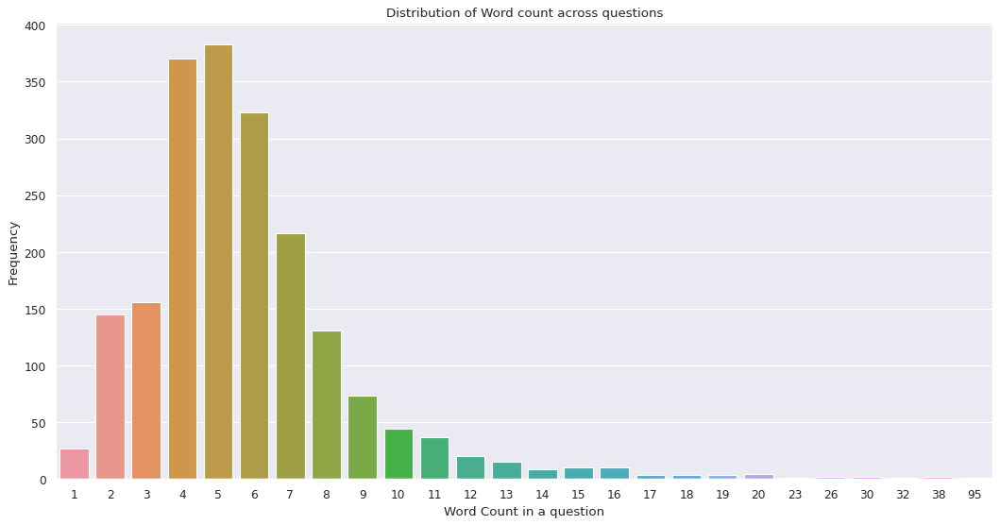

...

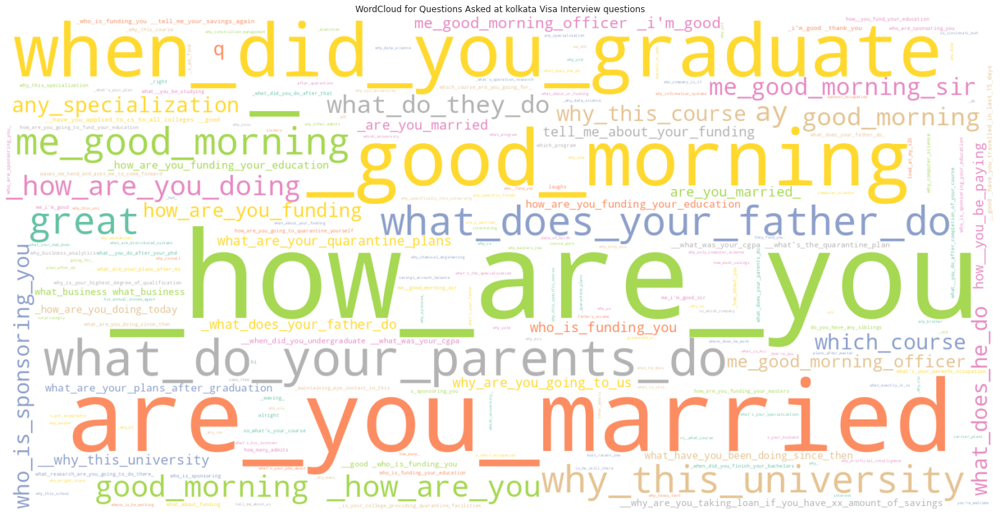

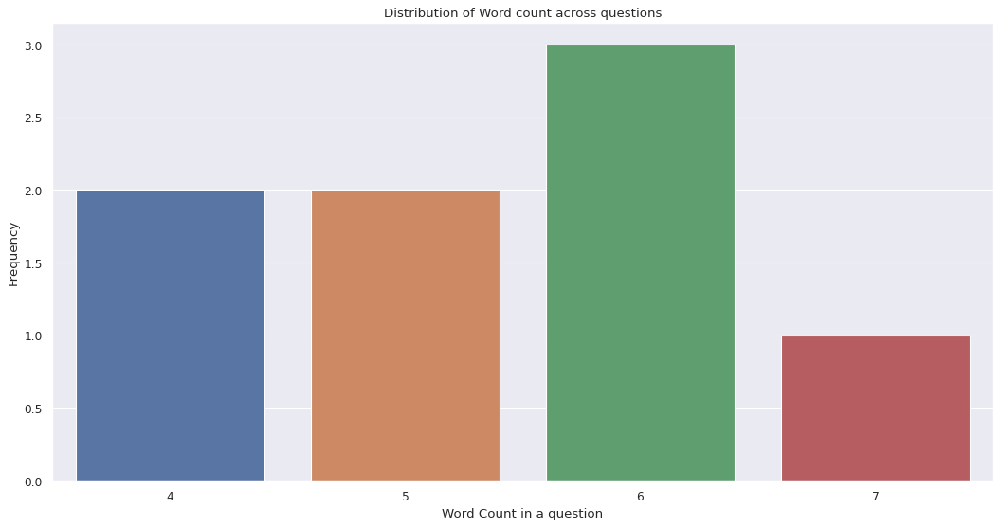

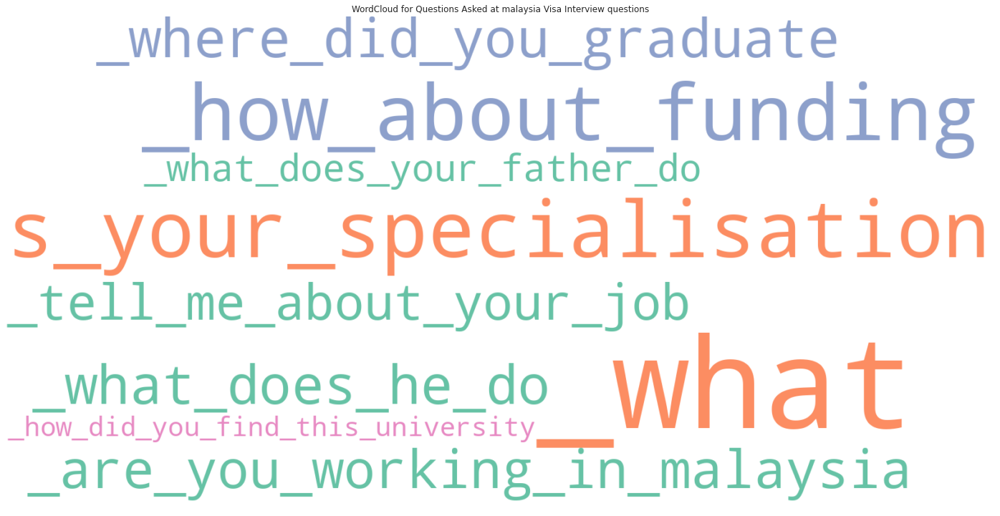

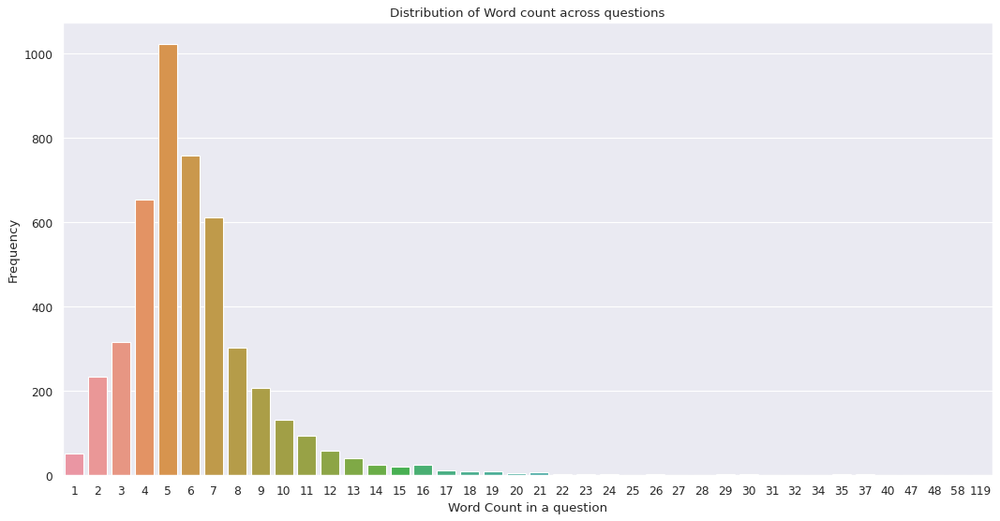

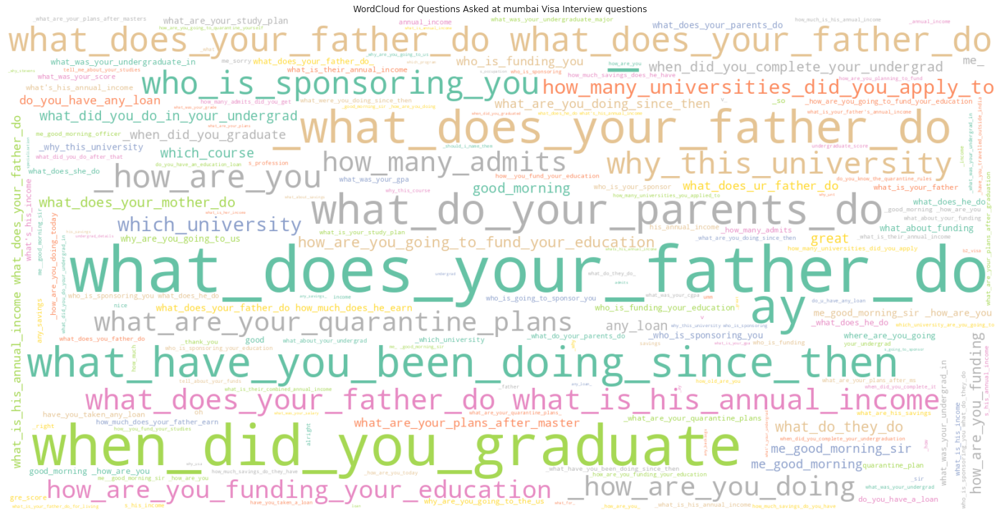

In [134]:
# Plots Per each region
# df['consulate_location'].value_counts()
for name, group in df.groupby('consulate_location'):
    # print(group.shape)
    unpacked_questions_list = prepare_question_list(group)
    # print(len(unpacked_questions_list))
    df_final_questions = clean_the_questions(unpacked_questions_list)
    plot_bar_chart(df_final_questions)
    plot_final_wordcloud_chart(df_final_questions, name)

/tmp/ipykernel_212/1410458520.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
(10875, 2)
/tmp/ipykernel_212/1410458520.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_final_questions = df_questions_to_clean[df_org_questions["word_question_length"] <= 35]
(957, 2)


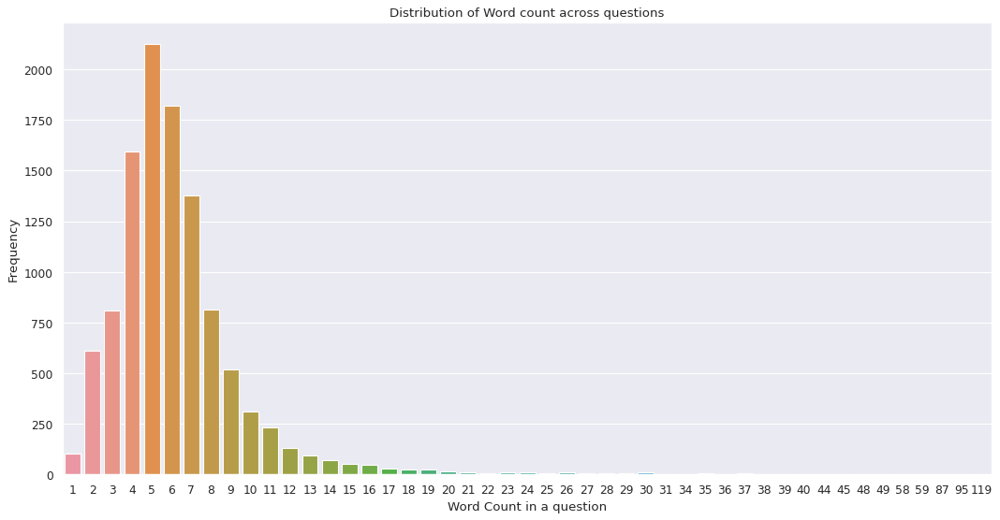

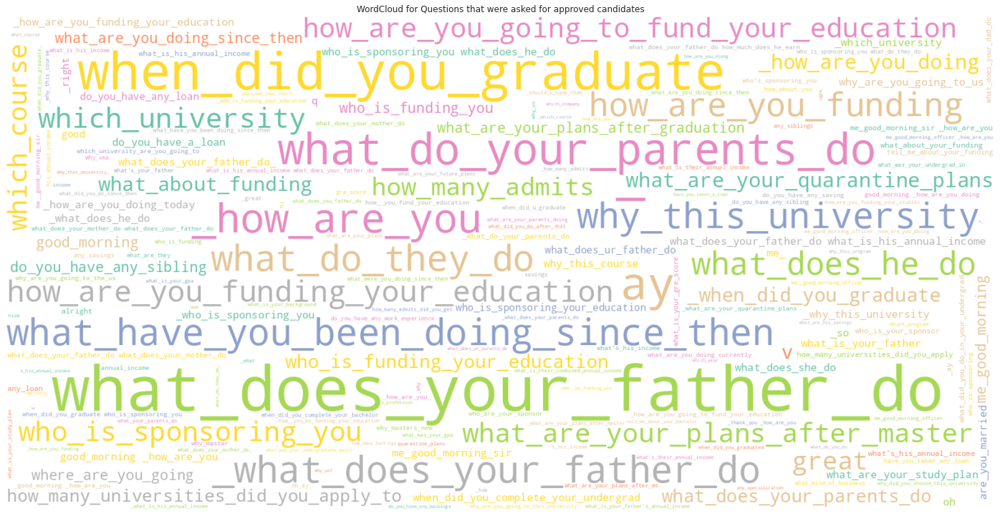

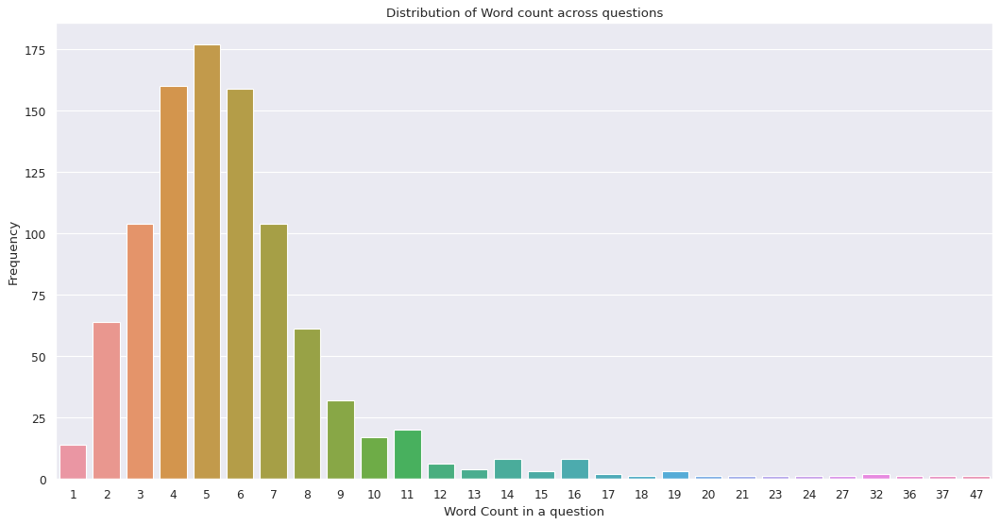

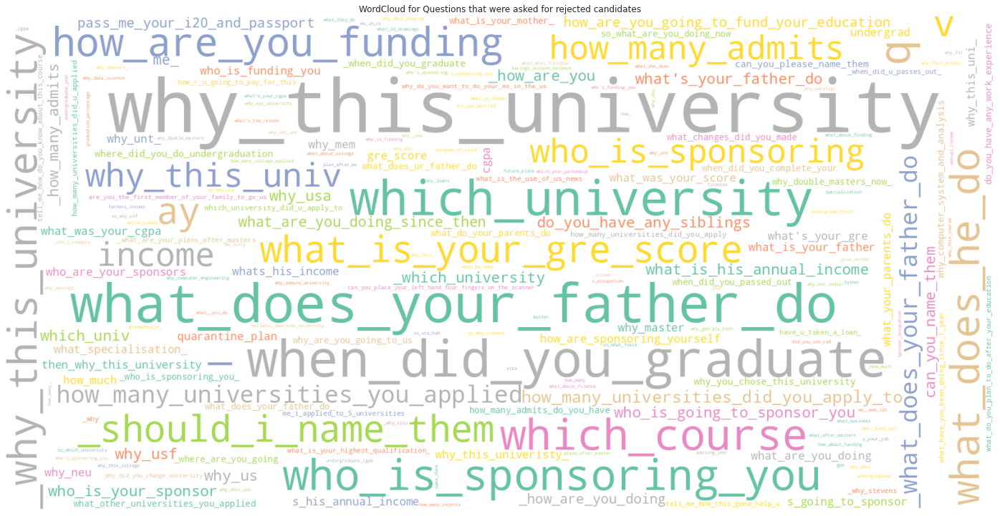

In [136]:
# Plots for accepted and rejected interviews
# df['visa_status'].value_counts()
# df['consulate_location'].value_counts()
for name, group in df.groupby('visa_status'):
    # print(group.shape)
    unpacked_questions_list = prepare_question_list(group)
    # print(len(unpacked_questions_list))
    df_final_questions = clean_the_questions(unpacked_questions_list)
    plot_bar_chart(df_final_questions)
    plot_final_wordcloud_chart(df_final_questions, v_status=name)